## **Importing Libraries to build Ensemble Machine Learning Algorithms**

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# For example, here's several helpful packages to load

import numpy as np                   # for performing linear algebraic operations
import pandas as pd                  # for performing data processing, CSV file I/O (e.g. pd.read_csv)
from   pandas import DataFrame       # importing dataframe from pandas to work with dataframe
from   scipy.spatial import distance # to find the euclidean distances between arrays 
import warnings                      # to report the warning scenarios
from   sklearn.metrics import classification_report, confusion_matrix # to measure the quality of the model predictions
import matplotlib.pyplot as plt      # to work with plots
import seaborn as sns                # to work with statistical graphs
import plotly.express as px          # to work with matrix/ column oriented data
from sklearn.feature_selection import SelectKBest # Imported for feature selection technique
from sklearn.feature_selection import chi2        # Imported for feature selection technique
from sklearn.preprocessing import MinMaxScaler    # to convert the features to given range
from collections import Counter                   # to count the total number of values as dictionary
from imblearn.over_sampling import SMOTE,ADASYN   # used to distribute the data evenly over sampling technique
from sklearn.preprocessing import RobustScaler,StandardScaler,LabelEncoder,LabelBinarizer # imported for transforming the value
from sklearn.preprocessing import StandardScaler  # To perform standard scaling

## **File Reading**

In [2]:
# Reading and checking the shape of the data
data = pd.read_csv('fifa21.csv')
data.shape

(18541, 92)

In [3]:
data.head()

,Unnamed: 0,ID,Name,Age,Photo,Nationality,Flag,Overall,Potential,Club,...,Penalties,Composure,Defensive Awareness,Standing Tackle,Sliding Tackle,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes
0,0,253283,Facundo Pellistri,18,https://cdn.sofifa.com/players/253/283/20_60.png,Uruguay,https://cdn.sofifa.com/flags/uy.png,71,87,Peñarol,...,66.0,61.0,35.0,11.0,18.0,9.0,12.0,7.0,8.0,7.0
1,1,179813,Edinson Cavani,32,https://cdn.sofifa.com/players/179/813/20_60.png,Uruguay,https://cdn.sofifa.com/flags/uy.png,86,86,Paris Saint-Germain,...,85.0,80.0,57.0,48.0,39.0,12.0,5.0,13.0,13.0,10.0
2,2,245541,Giovanni Reyna,17,https://cdn.sofifa.com/players/245/541/20_60.png,United States,https://cdn.sofifa.com/flags/us.png,68,87,Borussia Dortmund,...,50.0,59.0,30.0,23.0,24.0,10.0,13.0,14.0,12.0,7.0
3,3,233419,Raphael Dias Belloli,23,https://cdn.sofifa.com/players/233/419/20_60.png,Brazil,https://cdn.sofifa.com/flags/br.png,81,85,Stade Rennais FC,...,73.0,79.0,45.0,54.0,38.0,8.0,7.0,13.0,8.0,14.0
4,4,198710,James Rodríguez,28,https://cdn.sofifa.com/players/198/710/20_60.png,Colombia,https://cdn.sofifa.com/flags/co.png,82,82,Everton,...,81.0,87.0,52.0,41.0,44.0,15.0,15.0,15.0,5.0,14.0


## **Data Pre-Processing**

In [4]:
data.columns

Index(['Unnamed: 0', 'ID', 'Name', 'Age', 'Photo', 'Nationality', 'Flag',
       'Overall', 'Potential', 'Club', 'Club Logo', 'Value', 'Wage', 'Special',
       'Preferred Foot', 'Weak Foot', 'Skill Moves',
       'International Reputation', 'Work Rate', 'Body Type', 'Real Face',
       'Release Clause', 'Position', 'Jersey Number', 'Joined',
       'Contract Valid Until', 'Height', 'Weight', 'LS', 'ST', 'RS', 'LW',
       'LF', 'CF', 'RF', 'RW', 'LAM', 'CAM', 'RAM', 'LM', 'LCM', 'CM', 'RCM',
       'RM', 'LWB', 'LDM', 'CDM', 'RDM', 'RWB', 'LB', 'LCB', 'CB', 'RCB', 'RB',
       'GK', 'Likes', 'Dislikes', 'Following', 'Crossing', 'Finishing',
       'Heading Accuracy', 'Short Passing', 'Volleys', 'Dribbling', 'Curve',
       'FK Accuracy', 'Long Passing', 'Ball Control', 'Acceleration',
       'Sprint Speed', 'Agility', 'Reactions', 'Balance', 'Shot Power',
       'Jumping', 'Stamina', 'Strength', 'Long Shots', 'Aggression',
       'Interceptions', 'Positioning', 'Vision', 'Penalties', 

**Let's first consider the features which may influence the model.**

In [5]:
features = ['Name', 'Age', 'Nationality', 'Overall', 'Potential', 'Club', 'Value', 'Wage', 'Special',
       'Preferred Foot', 'Weak Foot', 'Skill Moves','International Reputation', 'Work Rate', 'Body Type', 
        'Position', 'Height', 'Weight', 'Likes', 'Dislikes', 'Following', 'Crossing', 'Finishing',
       'Heading Accuracy', 'Short Passing', 'Volleys', 'Dribbling', 'Curve','FK Accuracy', 'Long Passing', 
        'Ball Control', 'Acceleration','Sprint Speed', 'Agility', 'Reactions', 'Balance', 'Shot Power',
        'Jumping', 'Stamina', 'Strength', 'Long Shots', 'Aggression','Interceptions', 'Positioning', 
        'Vision', 'Penalties', 'Composure', 'Standing Tackle', 'Sliding Tackle', 
        'GK Diving','GK Handling', 'GK Kicking', 'GK Positioning', 'GK Reflexes']

In [6]:
# Incorporating those features in the dataframe
df = data[features]
df.shape

(18541, 54)

In [7]:
# Checking the column null values
df.isnull().sum()

Name                          0
Age                           0
Nationality                   0
Overall                       0
Potential                     0
Club                        371
Value                         0
Wage                          0
Special                       0
Preferred Foot                0
Weak Foot                     0
Skill Moves                   0
International Reputation      0
Work Rate                     0
Body Type                    51
Position                     25
Height                        0
Weight                        0
Likes                         0
Dislikes                      0
Following                     0
Crossing                    153
Finishing                   209
Heading Accuracy            133
Short Passing               220
Volleys                     163
Dribbling                   183
Curve                       120
FK Accuracy                  44
Long Passing                138
Ball Control                214
Accelera

### **Checking the distributions, skewness and Inter Quartile Range to fill the null values in the data**

<AxesSubplot:>

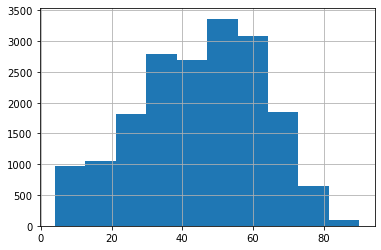

In [8]:
# Histogram to see the distribution of the data
df.Volleys.hist()

In [9]:
# Skew function to see how the data is skewed
print(df['Volleys'].skew())
df['Volleys'].describe()

-0.23510340268058694


count    18378.000000
mean        44.687997
std         17.746712
min          4.000000
25%         32.000000
50%         46.000000
75%         58.000000
max         90.000000
Name: Volleys, dtype: float64

In [10]:
# Skew function to see how the data is skewed
print(df['Balance'].skew())
df['Balance'].describe()

-0.6195177715778473


count    18364.000000
mean        64.528098
std         14.040552
min         17.000000
25%         57.000000
50%         67.000000
75%         74.000000
max         97.000000
Name: Balance, dtype: float64

In [11]:
# Inter Quartile Range check
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

Age                       8.0
Overall                   9.0
Potential                 8.0
Value               1850000.0
Wage                   9000.0
Special                 319.0
Likes                     6.0
Dislikes                  1.0
Following                33.0
Crossing                 25.0
Finishing                31.0
Heading Accuracy         20.0
Short Passing            14.0
Volleys                  26.0
Dribbling                17.0
Curve                    26.0
FK Accuracy              26.0
Long Passing             20.0
Ball Control             14.0
Acceleration             17.0
Sprint Speed             17.0
Agility                  18.0
Reactions                12.0
Balance                  17.0
Shot Power               20.0
Jumping                  15.0
Stamina                  17.0
Strength                 16.0
Long Shots               29.0
Aggression               25.0
Interceptions            38.5
Positioning              24.0
Vision                   19.0
Penalties 

## **Filling the null values with mean after checking the distributions**

In [12]:
df['Volleys'].replace({np.NaN:data['Volleys'].mean()},inplace=True)
df['Curve'].replace({np.NaN:data['Curve'].mean()},inplace=True)
df['Agility'].replace({np.NaN:data['Agility'].mean()},inplace=True)
df['Balance'].replace({np.NaN:data['Balance'].mean()},inplace=True)
df['Jumping'].replace({np.NaN:data['Jumping'].mean()},inplace=True)
df['Interceptions'].replace({np.NaN:data['Interceptions'].mean()},inplace=True)
df['Positioning'].replace({np.NaN:data['Positioning'].mean()},inplace=True)
df['Composure'].replace({np.NaN:data['Composure'].mean()},inplace=True)
df['Sliding Tackle'].replace({np.NaN:data['Sliding Tackle'].mean()},inplace=True)
df['Crossing'].replace({np.NaN:data['Crossing'].mean()},inplace=True)
df['Finishing'].replace({np.NaN:data['Finishing'].mean()},inplace=True)
df['Heading Accuracy'].replace({np.NaN:data['Heading Accuracy'].mean()},inplace=True)
df['Short Passing'].replace({np.NaN:data['Short Passing'].mean()},inplace=True)
df['Dribbling'].replace({np.NaN:data['Dribbling'].mean()},inplace=True)
df['FK Accuracy'].replace({np.NaN:data['FK Accuracy'].mean()},inplace=True)
df['Long Passing'].replace({np.NaN:data['Long Passing'].mean()},inplace=True)
df['Ball Control'].replace({np.NaN:data['Ball Control'].mean()},inplace=True)
df['Acceleration'].replace({np.NaN:data['Acceleration'].mean()},inplace=True)
df['Sprint Speed'].replace({np.NaN:data['Sprint Speed'].mean()},inplace=True)
df['Reactions'].replace({np.NaN:data['Reactions'].mean()},inplace=True)
df['Shot Power'].replace({np.NaN:data['Shot Power'].mean()},inplace=True)
df['Stamina'].replace({np.NaN:data['Stamina'].mean()},inplace=True)
df['Strength'].replace({np.NaN:data['Strength'].mean()},inplace=True)
df['Long Shots'].replace({np.NaN:data['Long Shots'].mean()},inplace=True)
df['Aggression'].replace({np.NaN:data['Aggression'].mean()},inplace=True)
df['Vision'].replace({np.NaN:data['Vision'].mean()},inplace=True)
df['Penalties'].replace({np.NaN:data['Penalties'].mean()},inplace=True)
df['Standing Tackle'].replace({np.NaN:data['Standing Tackle'].mean()},inplace=True)
df['GK Diving'].replace({np.NaN:data['GK Diving'].mean()},inplace=True)
df['GK Handling'].replace({np.NaN:data['GK Handling'].mean()},inplace=True)
df['GK Kicking'].replace({np.NaN:data['GK Kicking'].mean()},inplace=True)
df['GK Positioning'].replace({np.NaN:data['GK Positioning'].mean()},inplace=True)
df['GK Reflexes'].replace({np.NaN:data['GK Reflexes'].mean()},inplace=True)

C:\Users\91989\anaconda\lib\site-packages\pandas\core\generic.py:6619: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


# **Exploratory Data Analysis**

In [13]:
nat_cnt=df.groupby('Nationality').apply(lambda x:x['Name'].count()).reset_index(name='Counts')
nat_cnt.sort_values(by='Counts',ascending=False,inplace=True)
top_20_nat_cnt=nat_cnt[:20]
fig=px.bar(top_20_nat_cnt,x='Nationality',y='Counts',color='Counts',title='Nationwise Representation in the FIFA Game')
fig.show()

**Observations England has the highest number of players in FIFA 21 game. One of the major reasons in this regards is due to the EA franchise, which has predominatingly most user base in UK. Also in FIFA, English League has the most number of teams- generating the most number of players**

In [14]:
cnt_best_avg=df.groupby('Nationality').apply(lambda x:np.average(x['Overall'])).reset_index(name='Overall Ratings')
cnt_best_cnt=df.groupby('Nationality').apply(lambda x:x['Overall'].count()).reset_index(name='Player Counts')
snt_best_avg_cnt=pd.merge(cnt_best_avg,cnt_best_cnt,how='inner',left_on='Nationality',right_on='Nationality')
sel_best_avg_cnt=snt_best_avg_cnt[snt_best_avg_cnt['Player Counts']>=200]
sel_best_avg_cnt.sort_values(by=['Overall Ratings','Player Counts'],ascending=[False,False])
px.scatter(sel_best_avg_cnt,x='Overall Ratings',y='Player Counts',color='Player Counts',size='Overall Ratings',hover_data=['Nationality'],title='Nationwise Player counts and Average Potential')

**England and Brazil are the teams that deserve a mention in this aspect. England since it has produced 1856 players, and still is having an average of 63.28, while Brazil has the highest average Ratings among the players**

In [15]:
clb_cnt=df.groupby('Club').apply(lambda x:x['Name'].count()).reset_index(name='Counts')
clb_cnt.sort_values(by='Counts',ascending=False,inplace=True)
fig=px.scatter(clb_cnt,x='Club',y='Counts',color='Counts',title='Clubwise Player counts in FIFA 21')
fig.show()

**Bolton Wanderers with 48 players, Chelsea, Manchester United and AS Monaco have 45 players information for all the 3 clubs. Just a general observation, the average count of players for the English Premier League is more than any other leage. This shows the prioritization of English football by FIFA**

In [16]:
cnt_best_avg=df.groupby('Club').apply(lambda x:np.average(x['Overall'])).reset_index(name='Overall Ratings')
cnt_best_cnt=df.groupby('Club').apply(lambda x:x['Overall'].count()).reset_index(name='Player Counts')
snt_best_avg_cnt=pd.merge(cnt_best_avg,cnt_best_cnt,how='inner',left_on='Club',right_on='Club')
sel_best_avg_cnt=snt_best_avg_cnt[snt_best_avg_cnt['Player Counts']>=25]
sel_best_avg_cnt.sort_values(by=['Overall Ratings','Player Counts'],ascending=[False,False])
px.scatter(sel_best_avg_cnt,x='Overall Ratings',y='Player Counts',color='Player Counts',size='Overall Ratings',hover_data=['Club'],title='Clubwise player counts and Average Potential')

**As per the above chart, two teams deserve a special mention in this regard. Firstly it is Bayern Munich- The team which has the highest average rating among all the teams (81.46) from a set of 26 players. Another team is Real Madrid- which has the highest average among the teams with 45 players. They have an average of 79.06 on the 33 players**

In [17]:
props=df[['Name','Nationality','Club','Height','Weight']]
props['Ht in ft']=pd.to_numeric(props['Height'].str[0])
props['Ht in in']=pd.to_numeric(props['Height'].str.split("\'").str[1].str.strip('"'))
props['Ht in cm']=(props['Ht in ft']*12+props['Ht in in'])*2.54
props['Weight in lb']=pd.to_numeric(props['Weight'].str.strip('lbs'))
fig=px.scatter(props,x='Weight in lb',y='Ht in cm',color='Ht in cm',size='Weight in lb',hover_data=['Name','Nationality','Club'],title='Height vs Weight Variation of the players in FIFA 21')
fig.show()

<ipython-input-17-327b0aaca2bd>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-17-327b0aaca2bd>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-17-327b0aaca2bd>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-17-327b0aa

**Generally for a healthy football player, the height and weight are in a proportion. Else he/she will be too weak/heavy- and not have the peak fitness form. This is seen from the above scatter plot.**

In [18]:
pos_cnt=df.groupby('Position').apply(lambda x:x['Name'].count()).reset_index(name='Counts')
pos_cnt.sort_values(by='Counts',ascending=False,inplace=True)
top_20_pos_cnt=pos_cnt[:20]
fig=px.bar(top_20_pos_cnt,x='Position',y='Counts',color='Counts',title='Positionwise Player counts in FIFA 21')
fig.show()

# position abbreviation for reference

#  'Right Midfielder', 'Striker', 'Left Midfielder', 'Right Wing',
#        'Left Centre Midfielder', 'Right Safety', 'Running Back',
#        'Left Winger', 'Centre Midfielder', 'Cornerback',
#        'Centre Defensive Midfielder', 'Centre Attacking Midfielder',
#        'Linebacker', 'Right Attacking Midfielder',
#        'Right Centre Midfielder', 'Right Centre Back', 'Right Wing Back',
#        'Left Defensive Midfielder', 'Left Attacking Midfielder',
#        'Left Centre Back', 'Cente Forward', 'Long Snapper', 'Goalkeeper',
#        'Left Wing Back', 'Left Forward', 'Right Defensive Midfielder',
#        'Right Forward'

**The most number of player population is for the Striker, which is followed by Center Back Position and The goal keeper positions.**

In [19]:
age_cnt=df.groupby('Age').apply(lambda x:x['Name'].count()).reset_index(name='Counts')
fig=px.bar(age_cnt,x='Age',y='Counts',color='Counts',title='Agewise Player distribution in FIFA 21')
fig.show()

**The chart looks like a normal curve which is left skewed. On an average 20-24 is the average age for most of the footballers.**

In [20]:
top_play=df[['Name','Overall',"Age",'Club','Position']]
top_play.sort_values(by='Overall',ascending=False,inplace=True)
top_30_play=top_play[:100]
fig=px.scatter(top_30_play,x='Age',y='Overall',color='Age',size='Overall',hover_data=['Name','Club','Position'],title='Top Football Players in the FIFA 21 game')
fig.show()

C:\Users\91989\anaconda\lib\site-packages\pandas\util\_decorators.py:311: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



**Lionel Messi tops the board and then Cristiano Ronaldo. Among the youngest players, Kylian Mbappe, Jadon Snacho and Trent Alexander Arnold deserve a special mention.**

In [21]:
cond_1=df['Overall']!=df['Potential']
cond_2=df['Age']<25
df_fil=df[cond_1 & cond_2]
potential_play=df_fil[['Name','Age','Nationality','Club','Potential','Position','Overall','Value']]
potential_play.sort_values(by='Potential',ascending=False,inplace=True)
top_potential_play=potential_play[:50]
fig=px.scatter(potential_play,x='Age',y='Potential',size='Potential',color='Age',hover_data=['Name','Age','Nationality','Position','Overall','Value'],title='Age vs Maximum Potential Distribution of the young Players')
fig.show()

**The Potential cannot be equal to the Overall Score, and the age of the players must be smaller than 25**

In [23]:
final_team=df_fil[['Name','Age','Potential','Position','Club']]
final_team.sort_values(by='Age',inplace=True)
Position_play=final_team.groupby('Position').apply(lambda x:np.max(x['Potential'])).reset_index(name='Potential')
player_pos=pd.merge(final_team,Position_play,how='inner',left_on=['Position','Potential'],right_on=['Position','Potential'])
Position_best=player_pos[['Name','Club','Age','Position','Potential']]
cm = sns.light_palette("black", as_cmap=True) 
Position_best.style.background_gradient(cmap=cm).set_precision(2)

<ipython-input-23-6d068811c047>:7: FutureWarning:

this method is deprecated in favour of `Styler.format(precision=..)`



,Name,Club,Age,Position,Potential
0,Florian Wirtz,Bayer 04 Leverkusen,17,RCM,88
1,Isak Jansson,Kalmar FF,18,RF,73
2,Nuno Alexandre Tavares Mendes,Sporting CP,18,LWB,87
3,Reinier Jesus Carvalho,Borussia Dortmund,18,CF,87
4,Oliver Skipp,Norwich City,19,RDM,84
5,Jeremie Frimpong,Celtic,19,RWB,86
6,Thiago Almada,Vélez Sarsfield,19,LCM,89
7,Houssem Aouar,Olympique Lyonnais,22,LCM,89
8,Alphonso Davies,FC Bayern München,19,LB,89
9,Sergio Reguilón Rodríguez,Tottenham Hotspur,23,LB,89


In [24]:
india_team_all_players=df[df['Nationality']=='India']
india_team_2=india_team_all_players[['Name','Age','Overall','Position']]
india_team_2.sort_values(by='Position',inplace=True)
age_play=india_team_2.groupby('Position').apply(lambda x:np.max(x['Overall'])).reset_index(name='Overall')
player_pos=pd.merge(india_team_2,age_play,how='inner',left_on=['Position','Overall'],right_on=['Position','Overall'])
Position_best=player_pos[['Name','Age','Position','Overall']]
cm = sns.light_palette("cyan", as_cmap=True) 
Position_best.style.background_gradient(cmap=cm).set_precision(2)

<ipython-input-24-63178736c7f9>:8: FutureWarning:

this method is deprecated in favour of `Styler.format(precision=..)`



,Name,Age,Position,Overall
0,Remil Nadkarni,34,CAM,59
1,Anuvinda Khurana,27,CB,59
2,Bismeet Sidhu,32,CDM,60
3,Gajodara Chatterjee,34,GK,64
4,Adit Ginti,26,LB,61
5,Abhimoda Chakraborty,34,LCB,61
6,Chapal Palan,29,LCM,57
7,Attana Deshpande,39,LM,60
8,Halicharan Narzary,24,LM,60
9,Sunil Chhetri,33,LS,67


**Correlation plot**

**Representation of players with their age, position and potential**

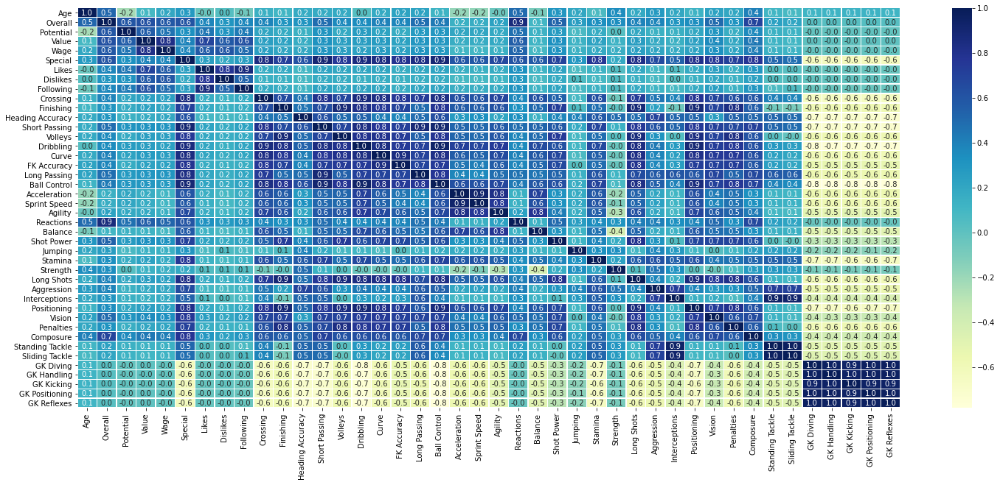

In [25]:
corr_ = df.corr()

f,ax = plt.subplots(figsize=(25, 10))
sns.heatmap(corr_,annot=True, linewidths=0.5, cmap="YlGnBu", fmt= '.1f',ax=ax)
plt.show()

In [26]:
df_new = df[(df['Value'] > 0)]

In [27]:
# Checking the unique values of position with respect to 27 positions
uniqueValues = df_new['Position'].unique()

#'RM', 'ST', 'LM', 'RW', 'LCM', 'RS', 'RB', 'LW', 'CM', 'CB', 'CDM',
#      'CAM', 'LB', 'RAM', 'RCM', 'RCB', 'RWB', 'LDM', 'LAM', 'LCB', 'CF',
#     'LS', 'GK', 'LWB', 'LF', 'RDM', 'RF'

In [28]:
# function for transforming each positions to particular 27 positions into their abbreviated positions
def complex_function(vc):
  if vc in ['RM']:
    return 'Right Midfielder'
  elif vc in ['ST']:
    return 'Striker'
  elif vc in ['LM']:
    return 'Left Midfielder'
  elif vc in ['RW']:
    return 'Right Wing'
  elif vc in ['LCM']:
    return 'Left Centre Midfielder'
  elif vc in ['RS']:
    return 'Right Safety'
  elif vc in ['RB']:
    return 'Running Back'
  elif vc in ['LW']:
    return 'Left Winger'
  elif vc in ['CM']:
    return 'Centre Midfielder'
  elif vc in ['CB']:
    return 'Cornerback'
  elif vc in ['CDM']:
    return 'Centre Defensive Midfielder'
  elif vc in ['CAM']:
    return 'Centre Attacking Midfielder'
  elif vc in ['LB']:
    return 'Linebacker'
  elif vc in ['RAM']:
    return 'Right Attacking Midfielder'
  elif vc in ['RCM']:
    return 'Right Centre Midfielder'
  elif vc in ['RCB']:
    return 'Right Centre Back'
  elif vc in ['RWB']:
    return 'Right Wing Back'
  elif vc in ['LDM']:
    return 'Left Defensive Midfielder'
  elif vc in ['LAM']:
    return 'Left Attacking Midfielder'
  elif vc in ['LCB']:
    return 'Left Centre Back'
  elif vc in ['CF']:
    return 'Cente Forward'
  elif vc in ['LS']:
    return 'Long Snapper'
  elif vc in ['GK']:
    return 'Goalkeeper'
  elif vc in ['LWB']:
    return 'Left Wing Back'
  elif vc in ['LF']:
    return 'Left Forward'
  elif vc in ['RDM']:
    return 'Right Defensive Midfielder'
  else:
    return 'Right Forward'

In [29]:
# Applying function to create new field based on certain transformation
df_new['Grouped_Position'] = df_new['Position'].apply(complex_function)

<ipython-input-29-49d2c1f136c3>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [30]:
# Adding the new transformed position field as Y df and dropped position field and made that as x df
x = df_new.drop(['Position','Grouped_Position'], axis = 1)
y = df_new['Grouped_Position']

print("Shape of x :", x.shape)
print("Shape of y :", y.shape)

Shape of x : (18033, 53)
Shape of y : (18033,)


## **Feature Selection**

In [31]:
feature_name = list(x.columns)
# no of maximum features we need to select
num_feats=30

**Label Encoding**

In [32]:
# Label Encoding to convert the features to model understandable format
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for i in range(0,x.shape[1]):
    if x.dtypes[i]=='object':
        x[x.columns[i]] = le.fit_transform(x[x.columns[i]])
        
print(x)

        Name  Age  Nationality  Overall  Potential  Club       Value  \
0       5283   18          162       71         87   598   4900000.0   
1       4574   32          162       86         86   588  35500000.0   
2       6299   17          161       68         87   116   1800000.0   
3      14368   23           21       81         85   755  23000000.0   
4       7594   28           34       82         82   280  22500000.0   
...      ...  ...          ...      ...        ...   ...         ...   
18535  14662   39           21       75         75   767    375000.0   
18536  15187   37           57       77         77   754    600000.0   
18537  15851   34           49       68         68   548    425000.0   
18539  16275   32           23       76         76    75   2200000.0   
18540  16303   35          149       67         67   389    110000.0   

           Wage  Special  Preferred Foot  ...     Vision  Penalties  \
0         500.0     1729               1  ...  63.000000       6

**Feature selection using selectkBest technique**

In [33]:
# converted the features to given range and selected the top 30 features
x_norm = MinMaxScaler().fit_transform(x)
chi_selector = SelectKBest(chi2, k=num_feats)
chi_selector.fit(x_norm, y)
chi_support = chi_selector.get_support()
chi_feature = x.loc[:,chi_support].columns.tolist()
print(str(len(chi_feature)), 'selected features')

30 selected features


In [34]:
# Displaying the top 30 features
chi_feature

['Special',
 'Preferred Foot',
 'Skill Moves',
 'Height',
 'Crossing',
 'Finishing',
 'Heading Accuracy',
 'Short Passing',
 'Volleys',
 'Dribbling',
 'Curve',
 'FK Accuracy',
 'Long Passing',
 'Ball Control',
 'Acceleration',
 'Sprint Speed',
 'Agility',
 'Stamina',
 'Long Shots',
 'Aggression',
 'Interceptions',
 'Positioning',
 'Penalties',
 'Standing Tackle',
 'Sliding Tackle',
 'GK Diving',
 'GK Handling',
 'GK Kicking',
 'GK Positioning',
 'GK Reflexes']

## **Dataframe creation after feature selection**

In [35]:
y = df_new['Grouped_Position']
x = df_new.drop(['Age', 'Nationality', 'Overall', 'Potential', 'Club', 'Value', 'Wage', 'Position', 'Grouped_Position', 'Weak Foot', 'International Reputation', 'Work Rate', 'Body Type', 'Weight', 'Likes', 'Dislikes', 'Following', 'Reactions', 'Balance', 'Shot Power', 'Jumping', 'Strength', 'Vision', 'Composure'], axis = 1)

print("Shape of x :", x.shape)
print("Shape of y :", y.shape)

Shape of x : (18033, 31)
Shape of y : (18033,)


In [36]:
# Label Encoding for final dataframe
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for i in range(0,x.shape[1]):
    if x.dtypes[i]=='object':
        x[x.columns[i]] = le.fit_transform(x[x.columns[i]])
        
print(x)

        Name  Special  Preferred Foot  Skill Moves  Height   Crossing  \
0       5283     1729               1            3      10  67.000000   
1       4574     2144               1            3      12  68.000000   
2       6299     1671               1            6      12  54.000000   
3      14368     2071               0            6      10  76.000000   
4       7594     2099               0            6       2  90.000000   
...      ...      ...             ...          ...     ...        ...   
18535  14662     1730               0            8      12  51.262508   
18536  15187     1086               1            0      12  10.000000   
18537  15851     1744               1            3       6  69.000000   
18539  16275     1920               1            3       2  61.000000   
18540  16303     1413               0            1      12  44.000000   

       Finishing  Heading Accuracy  Short Passing    Volleys  ...  \
0       60.00000              50.0       67.00000  56.

**Splitting the dataframe for train and test validation approach**

In [37]:
# using the train test split validation approach
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state = 0)

print("Shape of X_train :", X_train.shape)
print("Shape of X_test :", X_test.shape)
print("Shape of y_train :", y_train.shape)
print("Shape of y_test :", y_test.shape)

Shape of X_train : (12623, 31)
Shape of X_test : (5410, 31)
Shape of y_train : (12623,)
Shape of y_test : (5410,)


In [38]:
# the counts of the target variable to check the data imbalance
print('Classes and number of values in trainset',Counter(y_train))

Classes and number of values in trainset Counter({'Striker': 1612, 'Cornerback': 1235, 'Goalkeeper': 1195, 'Centre Midfielder': 962, 'Linebacker': 925, 'Running Back': 867, 'Left Midfielder': 734, 'Centre Attacking Midfielder': 733, 'Right Midfielder': 702, 'Centre Defensive Midfielder': 684, 'Right Centre Back': 435, 'Left Centre Back': 406, 'Right Wing': 353, 'Left Winger': 311, 'Left Centre Midfielder': 290, 'Right Centre Midfielder': 286, 'Right Defensive Midfielder': 162, 'Left Defensive Midfielder': 160, 'Right Safety': 158, 'Long Snapper': 139, 'Right Wing Back': 78, 'Left Wing Back': 76, 'Cente Forward': 68, 'Left Attacking Midfielder': 17, 'Right Attacking Midfielder': 13, 'Right Forward': 12, 'Left Forward': 10})


In [39]:
# Adaptive Synthetic Sampling Approach used for saampling the data
oversample = ADASYN(sampling_strategy='minority')
X_train,y_train = oversample.fit_resample(X_train,y_train)
print('Classes and number of values in trainset after ADSYN:',Counter(y_train))

Classes and number of values in trainset after ADSYN: Counter({'Striker': 1612, 'Left Forward': 1610, 'Cornerback': 1235, 'Goalkeeper': 1195, 'Centre Midfielder': 962, 'Linebacker': 925, 'Running Back': 867, 'Left Midfielder': 734, 'Centre Attacking Midfielder': 733, 'Right Midfielder': 702, 'Centre Defensive Midfielder': 684, 'Right Centre Back': 435, 'Left Centre Back': 406, 'Right Wing': 353, 'Left Winger': 311, 'Left Centre Midfielder': 290, 'Right Centre Midfielder': 286, 'Right Defensive Midfielder': 162, 'Left Defensive Midfielder': 160, 'Right Safety': 158, 'Long Snapper': 139, 'Right Wing Back': 78, 'Left Wing Back': 76, 'Cente Forward': 68, 'Left Attacking Midfielder': 17, 'Right Attacking Midfielder': 13, 'Right Forward': 12})


In [40]:
# Standard Scaling technique applied to the train and test dataframe
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

## **Model Building**

**Model Building using 4 different Ensemble Machine Learning Models like Support Vector Classifier, Logisitic Regressor Classifier, Random Forest Classifier, and Decision Tree Classifier which works on bagging and boosting approach and will obviously helps in improving the model performance when compared to all the other traditional models**

## **Support Vector Classifier**

**SVC Base Model**

In [41]:
from sklearn.svm import SVC
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
svc = SVC( kernel= 'rbf', gamma= 0.1, C= 9)
svc.fit(X_train, y_train)
y_pred = svc.predict(X_test)
# print('Training Accuracy: %1.3f.' % svc.score(X_train, y_train))
#10-fold cross validation score
cv = cross_val_score(estimator = svc, X = X_train, y = y_train, cv =3)
SVC_cv = cv.mean()
print("10 fold cross validation :", SVC_cv)
from sklearn.metrics import accuracy_score
SVC_ac = accuracy_score(y_pred,y_test)
print("accuracy :", SVC_ac)
from sklearn.metrics import precision_score
SVC_p = precision_score(y_pred,y_test,average='weighted')
print("precision :", SVC_p)
from sklearn.metrics import recall_score
SVC_r = recall_score(y_pred,y_test,average='weighted')
print("recall :", SVC_r)
from sklearn.metrics import f1_score
SVC_f1 = f1_score(y_test, y_pred,average='weighted')
print("F1 Score :", SVC_f1)

10 fold cross validation : 0.5794839344723336
accuracy : 0.5451016635859519
precision : 0.6020578832636704
recall : 0.5451016635859519
F1 Score : 0.5203601352303368


C:\Users\91989\anaconda\lib\site-packages\sklearn\metrics\_classification.py:1308: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



**Hyperparameter Tuning of the SVC Model**

In [42]:
svc_params = {'C': range(1, 10, 1), 'gamma': np.arange(0.1, 1, 0.1), 'kernel': ['rbf', 'linear']}

In [43]:
random_search = RandomizedSearchCV(estimator = svc, param_distributions = svc_params, n_iter = 20, cv = 5, verbose=2, random_state=42, n_jobs = -1)
random_search.fit(X_train, y_train)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


RandomizedSearchCV(cv=5, estimator=SVC(C=9, gamma=0.1), n_iter=20, n_jobs=-1,
                   param_distributions={'C': range(1, 10),
                                        'gamma': array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]),
                                        'kernel': ['rbf', 'linear']},
                   random_state=42, verbose=2)

**Printing the Best Hyperparameter values**

In [44]:
print('\n All results:')
print(random_search.cv_results_)
print('\n Best estimator:')
print(random_search.best_estimator_)
print('\n Best hyperparameters:')
print(random_search.best_params_)
results = pd.DataFrame(random_search.cv_results_)


 All results:
{'mean_fit_time': array([72.9763072 , 28.29323597, 33.64497542, 22.31337233, 51.80400729,
       16.2585885 , 27.6609498 , 18.41603851, 63.03048306, 17.43900781,
       13.77193389, 69.49190369, 10.91433601, 72.72032366, 61.1527276 ,
       66.37790694, 28.80565209, 71.4680922 , 65.31353068, 74.14727011]), 'std_fit_time': array([0.57290934, 3.68371245, 1.03617464, 0.4936851 , 0.69945037,
       0.24203276, 0.62052877, 0.35384827, 1.41569064, 1.33184864,
       0.69958215, 0.98855199, 0.71787247, 0.83334027, 1.95178939,
       1.74783126, 0.3898138 , 0.80234537, 0.9754031 , 0.4709589 ]), 'mean_score_time': array([16.79742212,  5.18152781,  4.7622479 ,  4.7531765 , 15.63290992,
        4.73891644,  4.3479373 ,  4.14531798, 13.20213099, 11.65975738,
        4.28109436, 15.5723536 ,  4.2950294 , 14.76763945, 13.57873387,
       13.17584667,  4.33072572, 15.14291024, 14.77452521, 15.69798021]), 'std_score_time': array([0.07897601, 0.26800267, 0.03930935, 0.09481468, 0.2697167

## **Tuned Model for SVC**

In [45]:
from sklearn.svm import SVC
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
tuned_svc = SVC( kernel= 'linear', gamma= 0.6, C= 2)
tuned_svc.fit(X_train, y_train)
y_pred = tuned_svc.predict(X_test)
#10-fold cross validation score
cv = cross_val_score(estimator = svc, X = X_train, y = y_train, cv =3)
tuned_SVC_cv = cv.mean()
print("10 fold cross validation :", SVC_cv)
from sklearn.metrics import accuracy_score
tuned_SVC_ac = accuracy_score(y_pred,y_test)
print("accuracy :", SVC_ac)
from sklearn.metrics import precision_score
tuned_SVC_p = precision_score(y_pred,y_test,average='weighted')
print("precision :", SVC_p)
from sklearn.metrics import recall_score
tuned_SVC_r = recall_score(y_pred,y_test,average='weighted')
print("recall :", SVC_r)
from sklearn.metrics import f1_score
tuned_SVC_f1 = f1_score(y_test, y_pred,average='weighted')
print("F1 Score :", SVC_f1)

10 fold cross validation : 0.5794839344723336
accuracy : 0.5451016635859519
precision : 0.6020578832636704
recall : 0.5451016635859519
F1 Score : 0.5203601352303368


C:\Users\91989\anaconda\lib\site-packages\sklearn\metrics\_classification.py:1308: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



## **Logistic Regression Classifier**

**Logisitic Regression Classifier Base Model**

In [46]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
lr = LogisticRegression(penalty = 'l2', C = 1 )
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)
#10-fold cross validation score
cv = cross_val_score(estimator = lr, X = X_train, y = y_train, cv =3)
log_cv = cv.mean()
print("10 fold cross validation :", log_cv)
from sklearn.metrics import accuracy_score
log_ac = accuracy_score(y_pred,y_test)
print("accuracy :", log_ac)
from sklearn.metrics import precision_score
log_p = precision_score(y_pred,y_test,average='weighted')
print("precision :", log_p)
from sklearn.metrics import recall_score
log_r = recall_score(y_pred,y_test,average='weighted')
print("recall :", log_r)
from sklearn.metrics import f1_score
log_f1 = f1_score(y_test, y_pred,average='weighted')
print("F1 Score :", log_f1)

C:\Users\91989\anaconda\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

C:\Users\91989\anaconda\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

C:\Users\91989\anaconda\lib\site-packages\sk

10 fold cross validation : 0.6088729522604233
accuracy : 0.5789279112754159
precision : 0.6859891917186395
recall : 0.5789279112754159
F1 Score : 0.5377591079504


**Hyperparameter Tuning of the Logistic Regression Classifier**

In [47]:
#Parameters for Hyper Parameter Tuning
lr_param={"C":np.logspace(-3,3,7), "penalty":["l1","l2"],}# l1 lasso l2 ridge
param_comb = 100

In [48]:
#Hyper parameter Tuning of Logistic regression
from sklearn.model_selection import RandomizedSearchCV
random_search = RandomizedSearchCV(lr, param_distributions=lr_param, n_iter=param_comb, scoring='accuracy', n_jobs= -1, verbose=3, random_state=10 )

In [49]:
random_search.fit(X_train, y_train)

C:\Users\91989\anaconda\lib\site-packages\sklearn\model_selection\_search.py:292: UserWarning:

The total space of parameters 14 is smaller than n_iter=100. Running 14 iterations. For exhaustive searches, use GridSearchCV.



Fitting 5 folds for each of 14 candidates, totalling 70 fits


C:\Users\91989\anaconda\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning:


35 fits failed out of a total of 70.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
35 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\91989\anaconda\lib\site-packages\sklearn\model_selection\_validation.py", line 681, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\91989\anaconda\lib\site-packages\sklearn\linear_model\_logistic.py", line 1461, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "C:\Users\91989\anaconda\lib\site-packages\sklearn\linear_model\_logistic.py", line 447, in _check_solver
    raise ValueError(
ValueEr

RandomizedSearchCV(estimator=LogisticRegression(C=1), n_iter=100, n_jobs=-1,
                   param_distributions={'C': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03]),
                                        'penalty': ['l1', 'l2']},
                   random_state=10, scoring='accuracy', verbose=3)

**Printing the Best Hyperparameter values**

In [50]:
print('\n All results:')
print(random_search.cv_results_)
print('\n Best estimator:')
print(random_search.best_estimator_)
print('\n Best hyperparameters:')
print(random_search.best_params_)
results = pd.DataFrame(random_search.cv_results_)


 All results:
{'mean_fit_time': array([8.01610947e-03, 6.39023204e+00, 6.73432350e-03, 6.98430405e+00,
       1.35680199e-02, 6.42419009e+00, 1.40621185e-02, 6.49334455e+00,
       1.41698837e-02, 6.02367821e+00, 1.05972767e-02, 4.84348087e+00,
       1.33993149e-02, 3.66272745e+00]), 'std_fit_time': array([6.64497824e-04, 4.29895042e-01, 4.23354666e-04, 4.20576708e-01,
       5.03736687e-04, 1.17561070e-01, 1.38782468e-03, 2.87739414e-01,
       1.17278474e-03, 5.52175014e-01, 2.41972229e-03, 1.13057034e-01,
       1.62418286e-03, 9.34293283e-01]), 'mean_score_time': array([0.        , 0.01269884, 0.        , 0.01296306, 0.        ,
       0.01250758, 0.        , 0.00911784, 0.        , 0.00819917,
       0.        , 0.00939212, 0.        , 0.0047998 ]), 'std_score_time': array([0.        , 0.00080979, 0.        , 0.00073626, 0.        ,
       0.00056283, 0.        , 0.00219518, 0.        , 0.00172558,
       0.        , 0.00134946, 0.        , 0.0013274 ]), 'param_penalty': masked_

## **Tuned Model for Logistic Regression Classifier**

In [51]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
tuned_lr = LogisticRegression(penalty = 'l2', C = 10.0 )
tuned_lr.fit(X_train, y_train)
y_pred = tuned_lr.predict(X_test)
#10-fold cross validation score
cv = cross_val_score(estimator = lr, X = X_train, y = y_train, cv =3)
tuned_log_cv = cv.mean()
print("10 fold cross validation :", log_cv)
from sklearn.metrics import accuracy_score
tuned_log_ac = accuracy_score(y_pred,y_test)
print("accuracy :", log_ac)
from sklearn.metrics import precision_score
tuned_log_p = precision_score(y_pred,y_test,average='weighted')
print("precision :", log_p)
from sklearn.metrics import recall_score
tuned_log_r = recall_score(y_pred,y_test,average='weighted')
print("recall :", log_r)
from sklearn.metrics import f1_score
tuned_log_f1 = f1_score(y_test, y_pred,average='weighted')
print("F1 Score :", log_f1)

C:\Users\91989\anaconda\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

C:\Users\91989\anaconda\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

C:\Users\91989\anaconda\lib\site-packages\sk

10 fold cross validation : 0.6088729522604233
accuracy : 0.5789279112754159
precision : 0.6859891917186395
recall : 0.5789279112754159
F1 Score : 0.5377591079504


C:\Users\91989\anaconda\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

C:\Users\91989\anaconda\lib\site-packages\sklearn\metrics\_classification.py:1308: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



## **Random Forest Classifier**

**Random Forest Classifier Base Model**

In [52]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
rf = RandomForestClassifier(n_estimators = 1860, min_samples_split = 2, min_samples_leaf = 4, max_features='auto', max_depth = 70, bootstrap = 'True')
rf.fit(X_train, y_train)
# Predicting the Test set results
y_pred = rf.predict(X_test)
#10-fold cross validation score
cv = cross_val_score(estimator = rf, X = X_train, y = y_train, cv =3)
rf_cv = cv.mean()
print("10 fold cross validation :", rf_cv)
from sklearn.metrics import accuracy_score
rf_ac = accuracy_score(y_pred,y_test)
print("accuracy :", rf_ac)
from sklearn.metrics import precision_score
rf_p = precision_score(y_pred,y_test,average='weighted')
print("precision :", rf_p)
from sklearn.metrics import recall_score
rf_r = recall_score(y_pred,y_test,average='weighted')
print("recall :", rf_r)
from sklearn.metrics import f1_score
rf_f1 = f1_score(y_test, y_pred,average='weighted')
print("F1 Score :", rf_f1)

10 fold cross validation : 0.613583632145117
accuracy : 0.57818853974122
precision : 0.74948997924365
recall : 0.57818853974122
F1 Score : 0.5100805862849009


C:\Users\91989\anaconda\lib\site-packages\sklearn\metrics\_classification.py:1308: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



**Hyperparameter Tuning of the Random Forest Classifier**

In [56]:
from sklearn.model_selection import RandomizedSearchCV
max_features = ['auto', 'sqrt']
n_estimators = range(200, 2000, 10)
max_depth = range(10, 110, 10)
min_samples_split = range(2, 10, 1)
min_samples_leaf = [1, 2, 4]
bootstrap = [True, False]
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
param_comb = 100

In [57]:
random_search = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 10, cv = 2, verbose=2, random_state=42, n_jobs = -1)
random_search.fit(X_train, y_train)

Fitting 2 folds for each of 10 candidates, totalling 20 fits


C:\Users\91989\anaconda\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning:


5 fits failed out of a total of 20.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\91989\anaconda\lib\site-packages\sklearn\model_selection\_validation.py", line 681, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\91989\anaconda\lib\site-packages\sklearn\ensemble\_forest.py", line 442, in fit
    trees = Parallel(
  File "C:\Users\91989\anaconda\lib\site-packages\joblib\parallel.py", line 1044, in __call__
    while self.dispatch_one_batch(iterator):
  File "C:\Users\91989\anaconda\lib\site-packages\jobli

RandomizedSearchCV(cv=2,
                   estimator=RandomForestClassifier(bootstrap='True',
                                                    max_depth=70,
                                                    min_samples_leaf=4,
                                                    n_estimators=1860),
                   n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': range(10, 110, 10),
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': range(2, 10),
                                        'n_estimators': range(200, 2000, 10)},
                   random_state=42, verbose=2)

**Printing the Best Hyperparameter Values**

In [58]:
print('\n All results:')
print(random_search.cv_results_)
print('\n Best estimator:')
print(random_search.best_estimator_)
print('\n Best hyperparameters:')
print(random_search.best_params_)
results = pd.DataFrame(random_search.cv_results_)


 All results:
{'mean_fit_time': array([ 82.26467204, 121.74127007, 124.02710021,  26.04055607,
        66.48215687,  51.61249995,  83.36093593, 116.77629352,
        92.49360895,  17.82156909]), 'std_fit_time': array([ 5.56401968,  1.85649872, 16.59584773,  0.28625906, 10.75828207,
       42.0364604 ,  0.44502187,  1.59050989,  1.20050287,  0.07442725]), 'mean_score_time': array([ 4.17252469, 15.2026788 ,  9.48827958,  3.94875956,  0.        ,
        7.23600137, 17.9124999 ,  7.80950809,  5.84799707,  1.44050109]), 'std_score_time': array([4.17252469, 1.86650169, 9.48827958, 0.23875856, 0.        ,
       7.23600137, 0.30950165, 0.48749256, 0.61600339, 0.25650036]), 'param_n_estimators': masked_array(data=[1180, 1870, 1920, 340, 1990, 1280, 1860, 1970, 1660,
                   380],
             mask=[False, False, False, False, False, False, False, False,
                   False, False],
       fill_value='?',
            dtype=object), 'param_min_samples_split': masked_array(data=

**Tuned Model for Random Forest Classifier**

In [59]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
tuned_rf = RandomForestClassifier(n_estimators = 1860, min_samples_split = 2, min_samples_leaf = 4, max_features='auto', max_depth = 70, bootstrap = 'True')
tuned_rf.fit(X_train, y_train)
# Predicting the Test set results
y_pred = tuned_rf.predict(X_test)
#10-fold cross validation score
cv = cross_val_score(estimator = rf, X = X_train, y = y_train, cv =3)
tuned_rf_cv = cv.mean()
print("10 fold cross validation :", rf_cv)
from sklearn.metrics import accuracy_score
tuned_rf_ac = accuracy_score(y_pred,y_test)
print("accuracy :", rf_ac)
from sklearn.metrics import precision_score
tuned_rf_p = precision_score(y_pred,y_test,average='weighted')
print("precision :", rf_p)
from sklearn.metrics import recall_score
tuned_rf_r = recall_score(y_pred,y_test,average='weighted')
print("recall :", rf_r)
from sklearn.metrics import f1_score
tuned_rf_f1 = f1_score(y_test, y_pred,average='weighted')
print("F1 Score :", rf_f1)

10 fold cross validation : 0.613583632145117
accuracy : 0.57818853974122
precision : 0.74948997924365
recall : 0.57818853974122
F1 Score : 0.5100805862849009


C:\Users\91989\anaconda\lib\site-packages\sklearn\metrics\_classification.py:1308: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



## **Decision Tree Classifier**

**Decision Tree Classifier Base Model**

In [60]:
# Fitting Decision Tree Classification to the Training set
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
classifier = DecisionTreeClassifier(min_samples_leaf = 6, max_features=7, max_depth= None, criterion = 'gini')
classifier.fit(X_train, y_train)

# Predicting the Test set results
y_pred = classifier.predict(X_test)

#10-fold cross validation score
cv = cross_val_score(estimator = classifier, X = X_train, y = y_train, cv =3)
dc_cv = cv.mean()
print("10 fold cross validation :", dc_cv)
from sklearn.metrics import accuracy_score
dc_ac = accuracy_score(y_pred,y_test)
print("accuracy :", dc_ac)
from sklearn.metrics import precision_score
dc_p = precision_score(y_pred,y_test,average='weighted')
print("precision :", dc_p)
from sklearn.metrics import recall_score
dc_r = recall_score(y_pred,y_test,average='weighted')
print("recall :", dc_r)
from sklearn.metrics import f1_score
dc_f1 = f1_score(y_test, y_pred,average='weighted')
print("F1 Score :", dc_f1)

10 fold cross validation : 0.4764817549040287
accuracy : 0.4491682070240296
precision : 0.4710557393564381
recall : 0.4491682070240296
F1 Score : 0.43992581921081286


C:\Users\91989\anaconda\lib\site-packages\sklearn\metrics\_classification.py:1308: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



**Hyperparameter Tuning of the Decision Tree Classifier**

In [61]:
param_dist = {"max_depth": [3, None],
              "max_features": range(1, 9),
              "min_samples_leaf": range(1, 9),
              "criterion": ["gini", "entropy"]}

In [62]:
random_search = RandomizedSearchCV(estimator = classifier, param_distributions = param_dist, n_iter = 10, cv = 5, verbose=2, random_state=42, n_jobs = -1)
random_search.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=5,
                   estimator=DecisionTreeClassifier(max_features=7,
                                                    min_samples_leaf=6),
                   n_jobs=-1,
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': [3, None],
                                        'max_features': range(1, 9),
                                        'min_samples_leaf': range(1, 9)},
                   random_state=42, verbose=2)

**Printing the Best Hyperparameter Values**

In [63]:
print('\n All results:')
print(random_search.cv_results_)
print('\n Best estimator:')
print(random_search.best_estimator_)
print('\n Best hyperparameters:')
print(random_search.best_params_)
results = pd.DataFrame(random_search.cv_results_)


 All results:
{'mean_fit_time': array([0.20039248, 0.02979498, 0.05319738, 0.09899726, 0.11639719,
       0.10019779, 0.27999811, 0.06999621, 0.03460159, 0.02999988]), 'std_fit_time': array([0.01273803, 0.00193682, 0.00431126, 0.00756082, 0.00611808,
       0.01870027, 0.02380569, 0.00745429, 0.00605414, 0.00626062]), 'mean_score_time': array([0.00640163, 0.00439811, 0.00520248, 0.00539813, 0.00480194,
       0.00460095, 0.00660005, 0.00480032, 0.00499949, 0.00319963]), 'std_score_time': array([0.00233549, 0.00048959, 0.00039843, 0.00048893, 0.00039957,
       0.00049053, 0.00326195, 0.00039959, 0.00063176, 0.00074781]), 'param_min_samples_leaf': masked_array(data=[5, 7, 8, 7, 6, 2, 3, 8, 2, 7],
             mask=[False, False, False, False, False, False, False, False,
                   False, False],
       fill_value='?',
            dtype=object), 'param_max_features': masked_array(data=[5, 1, 2, 2, 7, 8, 7, 5, 2, 4],
             mask=[False, False, False, False, False, False, Fa

**Tuned Model for Decision Tree Classifier**

In [64]:
# Fitting Decision Tree Classification to the Training set
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
tuned_classifier = DecisionTreeClassifier(min_samples_leaf = 6, max_features=7, max_depth= None, criterion = 'gini')
tuned_classifier.fit(X_train, y_train)

# Predicting the Test set results
y_pred = tuned_classifier.predict(X_test)

#10-fold cross validation score
cv = cross_val_score(estimator = classifier, X = X_train, y = y_train, cv =3)
tuned_dc_cv = cv.mean()
print("10 fold cross validation :", dc_cv)
from sklearn.metrics import accuracy_score
tuned_dc_ac = accuracy_score(y_pred,y_test)
print("accuracy :", dc_ac)
from sklearn.metrics import precision_score
tuned_dc_p = precision_score(y_pred,y_test,average='weighted')
print("precision :", dc_p)
from sklearn.metrics import recall_score
tuned_dc_r = recall_score(y_pred,y_test,average='weighted')
print("recall :", dc_r)
from sklearn.metrics import f1_score
tuned_dc_f1 = f1_score(y_test, y_pred,average='weighted')
print("F1 Score :", dc_f1)

10 fold cross validation : 0.4764817549040287
accuracy : 0.4491682070240296
precision : 0.4710557393564381
recall : 0.4491682070240296
F1 Score : 0.43992581921081286


C:\Users\91989\anaconda\lib\site-packages\sklearn\metrics\_classification.py:1308: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



## **Random Forest Classifier Base Model Evaluation Metrics**

In [66]:
def eval_result(rf, X_test, y_test, validation = False):
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        pred = rf.predict(X_test)
        print(classification_report(y_test, pred, target_names = ['Right Midfielder', 'Striker', 'Left Midfielder', 'Right Wing',
       'Left Centre Midfielder', 'Right Safety', 'Running Back',
       'Left Winger', 'Centre Midfielder', 'Cornerback',
       'Centre Defensive Midfielder', 'Centre Attacking Midfielder',
       'Linebacker', 'Right Attacking Midfielder',
       'Right Centre Midfielder', 'Right Centre Back', 'Right Wing Back',
       'Left Defensive Midfielder', 'Left Attacking Midfielder',
       'Left Centre Back', 'Cente Forward', 'Long Snapper', 'Goalkeeper',
       'Left Wing Back', 'Left Forward', 'Right Defensive Midfielder',
       'Right Forward']))
        display(pd.DataFrame(confusion_matrix(y_test, pred), 
                         columns = ['Predicted Right Midfielder', 'Predicted Striker', 'Predicted Left Midfielder', 'Predicted Right Wing',
       'Predicted Left Centre Midfielder', 'Predicted Right Safety', 'Predicted Running Back',
       'Predicted Left Winger', 'Predicted Centre Midfielder', 'Predicted Cornerback',
       'Predicted Centre Defensive Midfielder', 'Predicted Centre Attacking Midfielder',
       'Predicted Linebacker', 'Predicted Right Attacking Midfielder',
       'Predicted Right Centre Midfielder', 'Predicted Right Centre Back', 'Predicted Right Wing Back',
       'Predicted Left Defensive Midfielder', 'Predicted Left Attacking Midfielder',
       'Predicted Left Centre Back', 'Predicted Cente Forward', 'Predicted Long Snapper', 'Predicted Goalkeeper',
       'Predicted Left Wing Back', 'Predicted Left Forward', 'Predicted Right Defensive Midfielder',
       'Predicted Right Forward'],
                         index = ['Right Midfielder', 'Striker', 'Left Midfielder', 'Right Wing',
       'Left Centre Midfielder', 'Right Safety', 'Running Back',
       'Left Winger', 'Centre Midfielder', 'Cornerback',
       'Centre Defensive Midfielder', 'Centre Attacking Midfielder',
       'Linebacker', 'Right Attacking Midfielder',
       'Right Centre Midfielder', 'Right Centre Back', 'Right Wing Back',
       'Left Defensive Midfielder', 'Left Attacking Midfielder',
       'Left Centre Back', 'Cente Forward', 'Long Snapper', 'Goalkeeper',
       'Left Wing Back', 'Left Forward', 'Right Defensive Midfielder',
       'Right Forward']))
        
        if hasattr(rf, 'feature_importances_') and not validation:
            features = pd.DataFrame({
                'Variable'  :X_test.columns,
                'Importance':rf.feature_importances_
            })
            features.sort_values('Importance', ascending=False, inplace=True)
            display(features.head(20))

## **Random Forest Classifier Base Model Confusion Matrix**

In [67]:
eval_result(rf, X_test, y_test, validation = True)

                             precision    recall  f1-score   support

           Right Midfielder       0.00      0.00      0.00        32
                    Striker       0.41      0.51      0.46       327
            Left Midfielder       0.42      0.53      0.47       287
                 Right Wing       0.42      0.69      0.52       417
     Left Centre Midfielder       0.58      0.85      0.69       553
               Right Safety       1.00      1.00      1.00       505
               Running Back       0.00      0.00      0.00         4
                Left Winger       0.47      0.03      0.06       204
          Centre Midfielder       0.00      0.00      0.00       108
                 Cornerback       0.00      0.00      0.00        53
Centre Defensive Midfielder       0.00      0.00      0.00         6
Centre Attacking Midfielder       0.28      0.29      0.29       338
                 Linebacker       0.00      0.00      0.00        30
 Right Attacking Midfielder      

,Predicted Right Midfielder,Predicted Striker,Predicted Left Midfielder,Predicted Right Wing,Predicted Left Centre Midfielder,Predicted Right Safety,Predicted Running Back,Predicted Left Winger,Predicted Centre Midfielder,Predicted Cornerback,...,Predicted Left Defensive Midfielder,Predicted Left Attacking Midfielder,Predicted Left Centre Back,Predicted Cente Forward,Predicted Long Snapper,Predicted Goalkeeper,Predicted Left Wing Back,Predicted Left Forward,Predicted Right Defensive Midfielder,Predicted Right Forward
Right Midfielder,0,7,0,5,0,0,0,0,0,0,...,0,0,0,0,2,0,0,0,0,16
Striker,0,166,2,66,0,0,0,0,0,0,...,0,0,0,0,15,0,0,0,4,35
Left Midfielder,0,1,151,83,28,0,0,0,0,0,...,0,0,0,0,0,0,0,0,18,0
Right Wing,0,37,59,286,0,0,0,0,2,0,...,0,1,0,0,1,0,0,0,14,2
Left Centre Midfielder,0,0,28,4,472,1,0,5,0,0,...,9,0,0,0,0,0,0,0,21,0
Right Safety,0,0,0,0,0,505,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Running Back,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
Left Winger,0,0,9,4,149,0,0,7,0,0,...,6,0,0,0,0,0,0,0,5,0
Centre Midfielder,0,15,21,47,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,2,3
Cornerback,0,4,14,26,4,0,0,0,0,0,...,0,0,0,0,0,0,0,0,4,0


## **Random Forest Classifier Base Model Heat Map**

<AxesSubplot:>

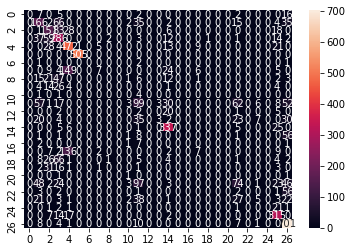

In [68]:
# displaying confusion matrix and heat map to find correlation
cm = confusion_matrix(y_test,rf.predict(X_test))
sns.heatmap(cm,annot=True,fmt="d")

## Support Vector Classifier Tuned Model Evaluation Metrics

In [94]:
def eval_result(tuned_svc, X_test, y_test, validation = False):
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        pred = tuned_svc.predict(X_test)
        print(classification_report(y_test, pred, target_names = ['Right Midfielder', 'Striker', 'Left Midfielder', 'Right Wing',
       'Left Centre Midfielder', 'Right Safety', 'Running Back',
       'Left Winger', 'Centre Midfielder', 'Cornerback',
       'Centre Defensive Midfielder', 'Centre Attacking Midfielder',
       'Linebacker', 'Right Attacking Midfielder',
       'Right Centre Midfielder', 'Right Centre Back', 'Right Wing Back',
       'Left Defensive Midfielder', 'Left Attacking Midfielder',
       'Left Centre Back', 'Cente Forward', 'Long Snapper', 'Goalkeeper',
       'Left Wing Back', 'Left Forward', 'Right Defensive Midfielder',
       'Right Forward']))
        display(pd.DataFrame(confusion_matrix(y_test, pred), 
                         columns = ['Predicted Right Midfielder', 'Predicted Striker', 'Predicted Left Midfielder', 'Predicted Right Wing',
       'Predicted Left Centre Midfielder', 'Predicted Right Safety', 'Predicted Running Back',
       'Predicted Left Winger', 'Predicted Centre Midfielder', 'Predicted Cornerback',
       'Predicted Centre Defensive Midfielder', 'Predicted Centre Attacking Midfielder',
       'Predicted Linebacker', 'Predicted Right Attacking Midfielder',
       'Predicted Right Centre Midfielder', 'Predicted Right Centre Back', 'Predicted Right Wing Back',
       'Predicted Left Defensive Midfielder', 'Predicted Left Attacking Midfielder',
       'Predicted Left Centre Back', 'Predicted Cente Forward', 'Predicted Long Snapper', 'Predicted Goalkeeper',
       'Predicted Left Wing Back', 'Predicted Left Forward', 'Predicted Right Defensive Midfielder',
       'Predicted Right Forward'],
                         index = ['Right Midfielder', 'Striker', 'Left Midfielder', 'Right Wing',
       'Left Centre Midfielder', 'Right Safety', 'Running Back',
       'Left Winger', 'Centre Midfielder', 'Cornerback',
       'Centre Defensive Midfielder', 'Centre Attacking Midfielder',
       'Linebacker', 'Right Attacking Midfielder',
       'Right Centre Midfielder', 'Right Centre Back', 'Right Wing Back',
       'Left Defensive Midfielder', 'Left Attacking Midfielder',
       'Left Centre Back', 'Cente Forward', 'Long Snapper', 'Goalkeeper',
       'Left Wing Back', 'Left Forward', 'Right Defensive Midfielder',
       'Right Forward']))
        
        if hasattr(tuned_svc, 'feature_importances_') and not validation:
            features = pd.DataFrame({
                'Variable'  :X_test.columns,
                'Importance':tuned_svc.feature_importances_
            })
            features.sort_values('Importance', ascending=False, inplace=True)
            display(features.head(20))

## Support Vector Classifier Tuned Model Confusion Matrix

In [95]:
eval_result(tuned_svc, X_test, y_test, validation = True)

                             precision    recall  f1-score   support

           Right Midfielder       0.00      0.00      0.00        32
                    Striker       0.42      0.57      0.48       327
            Left Midfielder       0.41      0.60      0.49       287
                 Right Wing       0.44      0.68      0.53       417
     Left Centre Midfielder       0.59      0.88      0.70       553
               Right Safety       1.00      1.00      1.00       505
               Running Back       0.00      0.00      0.00         4
                Left Winger       0.00      0.00      0.00       204
          Centre Midfielder       0.50      0.01      0.02       108
                 Cornerback       0.00      0.00      0.00        53
Centre Defensive Midfielder       0.00      0.00      0.00         6
Centre Attacking Midfielder       0.34      0.39      0.36       338
                 Linebacker       0.00      0.00      0.00        30
 Right Attacking Midfielder      

,Predicted Right Midfielder,Predicted Striker,Predicted Left Midfielder,Predicted Right Wing,Predicted Left Centre Midfielder,Predicted Right Safety,Predicted Running Back,Predicted Left Winger,Predicted Centre Midfielder,Predicted Cornerback,...,Predicted Left Defensive Midfielder,Predicted Left Attacking Midfielder,Predicted Left Centre Back,Predicted Cente Forward,Predicted Long Snapper,Predicted Goalkeeper,Predicted Left Wing Back,Predicted Left Forward,Predicted Right Defensive Midfielder,Predicted Right Forward
Right Midfielder,0,11,0,4,0,0,0,0,0,0,...,0,0,0,0,3,0,0,0,0,11
Striker,0,185,1,60,0,0,0,0,0,0,...,0,1,0,0,19,0,0,0,2,24
Left Midfielder,0,1,173,74,18,0,0,0,0,0,...,0,0,0,0,1,0,0,0,14,0
Right Wing,0,38,67,283,0,0,0,0,1,0,...,0,1,0,0,8,0,0,0,6,1
Left Centre Midfielder,0,0,31,4,489,0,0,1,0,0,...,1,0,0,0,0,0,0,0,20,0
Right Safety,0,0,0,0,0,505,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Running Back,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
Left Winger,0,0,16,2,163,0,0,0,0,0,...,0,0,0,0,0,0,0,0,3,0
Centre Midfielder,0,14,23,51,1,0,0,1,1,0,...,0,0,0,0,2,0,0,0,2,2
Cornerback,0,6,18,26,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


## Support Vector Classifier Tuned Model Heat Map

<AxesSubplot:>

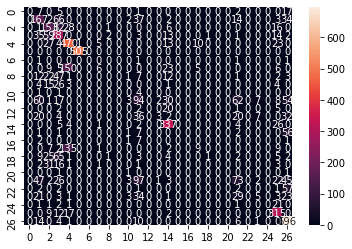

In [96]:
# displaying confusion matrix and heat map to find correlation
cm = confusion_matrix(y_test,tuned_rf.predict(X_test))
sns.heatmap(cm,annot=True,fmt="d")

### **Model Summary**

## **Model Summary for 27 different positions Classifier Base Model**

**Evaluation Summary Table for 27 different positions Classifier Base Model**

In [72]:
accuracy = [SVC_ac,log_ac,rf_ac,dc_ac]
ten_fold_cross_validation = [SVC_cv,log_cv,rf_cv,dc_cv]
f1_score = [SVC_f1,log_f1,rf_f1,dc_f1]
precision = [SVC_p,log_p,rf_p,dc_p]
recall = [SVC_r,log_r,rf_r,dc_r]
models = DataFrame({'Accuracy': accuracy, '10 fold cv': ten_fold_cross_validation, 
                    "f1 score": f1_score,'precision': precision,
                   'recall': recall})
models.index = ['Support Vector Classifier','Logistic Regression Classifier','Random Forest Classifier','Decision Tree Classifier']
models

,Accuracy,10 fold cv,f1 score,precision,recall
Support Vector Classifier,0.545102,0.579484,0.520360,0.602058,0.545102
Logistic Regression Classifier,0.578928,0.608873,0.537759,0.685989,0.578928
Random Forest Classifier,0.578189,0.613584,0.510081,0.749490,0.578189
Decision Tree Classifier,0.449168,0.476482,0.439926,0.471056,0.449168


**Evaluation Summary Graph for 27 different positions Classifier Base Model**

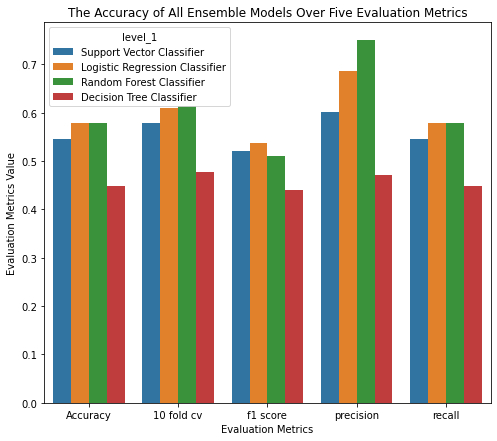

In [73]:
models1 = DataFrame({'Accuracy' : models.unstack()}).reset_index()
# plot accuracies
plt.figure(figsize=(8, 7))
fig_models = sns.barplot(x='level_0', y='Accuracy', hue='level_1', data=models1);
fig_models.set(xlabel='Evaluation Metrics', ylabel='Evaluation Metrics Value');
fig_models.set_title('The Accuracy of All Ensemble Models Over Five Evaluation Metrics');

## Random Forest Classifier performs better when comapred with other 3 Base models evaluation metrics in predicting the 27 different positions of the player

## **Model Summary for 27 different positions Classifier Tuned Model**

**Evaluation Summary Table for 27 different positions Classifier Tuned Model**

In [74]:
accuracy = [tuned_SVC_ac,tuned_log_ac,tuned_rf_ac,tuned_dc_ac]
ten_fold_cross_validation = [tuned_SVC_cv,tuned_log_cv,tuned_rf_cv,tuned_dc_cv]
f1_score = [tuned_SVC_f1,tuned_log_f1,tuned_rf_f1,tuned_dc_f1]
precision = [tuned_SVC_p,tuned_log_p,tuned_rf_p,tuned_dc_p]
recall = [tuned_SVC_r,tuned_log_r,tuned_rf_r,tuned_dc_r]
models = DataFrame({'Accuracy': accuracy, '10 fold cv': ten_fold_cross_validation, 
                    "f1 score": f1_score,'precision': precision,
                   'recall': recall})
models.index = ['Support Vector Classifier','Logistic Regression Classifier','Random Forest Classifier','Decision Tree Classifier']
models

,Accuracy,10 fold cv,f1 score,precision,recall
Support Vector Classifier,0.592606,0.579484,0.523631,0.758080,0.592606
Logistic Regression Classifier,0.577634,0.608873,0.537268,0.682224,0.577634
Random Forest Classifier,0.576895,0.613935,0.509284,0.747324,0.576895
Decision Tree Classifier,0.436414,0.479083,0.425349,0.461761,0.436414


**Evaluation Summary Graph for 27 different positions Classifier Tuned Model**

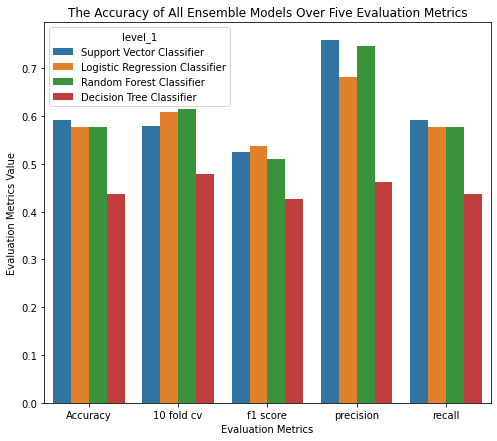

In [75]:
models1 = DataFrame({'Accuracy' : models.unstack()}).reset_index()
# plot accuracies
plt.figure(figsize=(8, 7))
fig_models = sns.barplot(x='level_0', y='Accuracy', hue='level_1', data=models1);
fig_models.set(xlabel='Evaluation Metrics', ylabel='Evaluation Metrics Value');
fig_models.set_title('The Accuracy of All Ensemble Models Over Five Evaluation Metrics');

## Support Vector Classifier performs better when compared to all other 3 Tuned models evaluation metrics in predicting the 27 different positions of the player

## Overall conclusion for the 27 different positions classifier models comparing Base and Tuned models is below

## Overall, Tuned Support Vector Classifier performs better when compared to Base Random Forest Classifier and all other models evaluation metrics in predicting the 27 different positions of the player